### Final Project : Deep Reinforcement Learning Extended

### Stanley Chou RUID:193005065 , Anis Chihoub, Sunny Chen
### Due: 12/16/2022

#1 Imports and Making sure the Environment Works

## N.B this notebook only contatins the code for getting the DQN to work, the PPO is in the other submitted notebook because we could not get it to run on Colab

## Final Result Video Demo Links at the End

In [ ]:

#installs gym retro and things needed for displaying stuff in collab
!pip install gym gym-retro
!apt-get install x11-utils > /dev/null 2>&1 
!pip install pyglet > /dev/null 2>&1 
!apt-get install -y xvfb python-opengl > /dev/null 2>&1
!pip install gym pyvirtualdisplay > /dev/null 2>&1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Create a screen for rendering

from pyvirtualdisplay import Display
display = Display(visible=0, size=(400, 300))
display.start()

In [ ]:
# need this for the environment to work
!pip install gym[classic_control]

!pip install gym==0.21

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import gym

# Import retro to play Street Fighter using a ROM
import retro
# Import time to slow down game
import time
import torch
#import google drive from colab in order to avoid reuploading
from google.colab import drive

drive.mount('/content/drive/')

# See the different retro games
#retro.data.list_games()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
#General Imports

import math
import random
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from IPython import display as ipythondisplay
from collections import namedtuple, deque
from itertools import count
from PIL import Image
from gym.wrappers import Monitor
from gym.wrappers.monitoring.video_recorder import VideoRecorder
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as T

import math
import glob
import io
import base64
from IPython.display import HTML

In [ ]:
%cd drive
%cd MyDrive
%cd Robotics_and_CompVision_Final_Project
%cd ROM

/content/drive
/content/drive/MyDrive
/content/drive/MyDrive/Robotics_and_CompVision_Final_Project
/content/drive/MyDrive/Robotics_and_CompVision_Final_Project/ROM


In [ ]:
#download rom
!python -m retro.import .

Importing StreetFighterIISpecialChampionEdition-Genesis
Imported 1 games


In [ ]:
#load our environment
env = retro.make(game= 'StreetFighterIISpecialChampionEdition-Genesis')



In [ ]:
"""
Utility functions to enable video recording of gym environment and displaying it
To enable video, just do "env = wrap_env(env)""
"""

def show_video():
  mp4list = glob.glob('video/*.mp4')
  if len(mp4list) > 0:
    mp4 = mp4list[0]
    video = io.open(mp4, 'r+b').read()
    encoded = base64.b64encode(video)
    ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                loop controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
  else: 
    print("Could not find video")
    

def wrap_env(env):
  env = Monitor(env, './video', force=True)
  return env

In [ ]:
#let's us see the dimension of the screen
env.observation_space.sample()

array([[[124,   8,  74],
        [ 75,  12, 129],
        [251, 131,   8],
        ...,
        [  8, 223, 189],
        [ 66,  26, 179],
        [ 96, 180, 203]],

       [[209, 189,  84],
        [184,   9, 134],
        [196, 127,  28],
        ...,
        [134, 100,   1],
        [ 25,  82, 216],
        [205, 186,  50]],

       [[244,  87,  92],
        [254,  92,  64],
        [104, 153, 201],
        ...,
        [220, 220, 129],
        [ 47, 163, 142],
        [198, 244, 160]],

       ...,

       [[148, 203,  98],
        [157, 245, 213],
        [211,  78, 102],
        ...,
        [ 57, 133, 103],
        [210, 218,  14],
        [185,  97,  75]],

       [[ 49,  15, 253],
        [  7,  37, 161],
        [216, 128, 153],
        ...,
        [221, 151,  82],
        [224,  31,  86],
        [ 35, 235,  29]],

       [[163, 152, 106],
        [241, 237, 209],
        [ 58, 145, 149],
        ...,
        [ 42,  49, 194],
        [247, 115, 192],
        [140, 251,  64]]

In [ ]:
env.observation_space

Box([[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]], [[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
 

In [ ]:
#view the actions that we are working with
#12 actions correspond to the 12 buttons we can press while playing street fighter
env.action_space.sample()



array([0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1], dtype=int8)

In [ ]:
env.close()
env = wrap_env(retro.make(game= 'StreetFighterIISpecialChampionEdition-Genesis'))

/usr/local/lib/python3.8/dist-packages/gym/wrappers/monitor.py:86: UserWarning: WARN: Trying to monitor an environment which has no 'spec' set. This usually means you did not create it via 'gym.make', and is recommended only for advanced users.
  logger.warn(


In [ ]:
#Testing to see if the environment is correct, this demo just has the Agent randomly moving
# Reset game to starting state
obs = env.reset()
# Set flag to flase
done = False
for game in range(1): 
    while not done: 
        if done: 
            obs = env.reset()
        screen = env.render(mode='rgb_array')
        obs, reward, done, info = env.step(env.action_space.sample())
        time.sleep(0.01)
        #print(reward)



env.close()
show_video()     


In [ ]:
#what the info for this game is, from this we can see that we can take score and health and enemy health to create a reward function
info

{'enemy_matches_won': 2,
 'score': 6300,
 'matches_won': 0,
 'continuetimer': 10,
 'enemy_health': 0,
 'health': 0}

#2 Preprocessing and Making the Model

# Need to add preprocessing - grey scale the screen, get the frame differences currentscreen -last screen, possibly downsize the data
#adjust the reward function to make it less sparse - and make it equal to the score of the game + the health you take away from the opponent, and minus the health you lose

In [ ]:


# Import the space shapes for the environment
from gym import spaces
from gym.spaces import MultiBinary, Box
# Import numpy to calculate frame delta 
import numpy as np
# Import opencv for grayscaling
import cv2




     


In [ ]:
##Snippet of code for testing preprocessing image values, allows us to see what the image is that we are creating from altering it
gray = cv2.cvtColor(obs, cv2.COLOR_BGR2GRAY)
resize = cv2.resize(gray, (128,128), interpolation=cv2.INTER_CUBIC)
channels = np.reshape(resize, (128,128,1))

In [ ]:
channels.shape

(128, 128, 1)

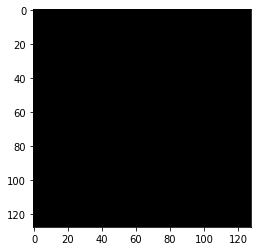

In [ ]:
plt.imshow(cv2.cvtColor(channels, cv2.COLOR_BGR2RGB))

In [ ]:
#The custom environment is necessarry for us to implement our own loss functions

# Create custom environment 
class StreetFighter(gym.Env): 
    def __init__(self):
        super().__init__()
        # Specify action space and observation space 
        #The dimensions for the game environment itself is this in gray scale)
        self.observation_space = Box(low=0, high=255, shape=(128, 128, 1), dtype=np.uint8)
        #12 possible button presses on the fighting controller hence multibinary 12
        self.action_space = MultiBinary(12)
        # Startup and instance of the game 
        #the filter parameter forces the agent to only use valid button combinations e.g no passing [1,1,1,1,1,1,1,1,1,1,1,1] as the action vector and getting something 
        # (this example vector is equivalent to a person holding all the buttons on the arcade box controller and inputting all 4 directions at the same time which is impossible and does nothing so don't do it)
        self.game = retro.make(game='StreetFighterIISpecialChampionEdition-Genesis', use_restricted_actions = retro.Actions.FILTERED)
    
    def reset(self):
        # Return the first frame 
        obs = self.game.reset()
        obs = self.preprocess(obs) 
        #reset state so the previous frame in this case is the initial frame
        self.previous_frame = obs 
        
        # Create a attribute to hold the score delta 
        self.score = 0 
        # Create a attribute to hold the Player Health delta
        self.health = 176 
        # Create a attribute to hold the Enemy Health delta The default health for characters at each round is 176
        self.enemy_health = 176
        return obs
    
    #Grayscaling and resizing the image to improve training time since we are poor and need computations to be easy
    #Original image is 200x256x3 so we are turning it into a grayscale image of half the y dimension 128x128x1 (originally we did 100x128x1 but for some reason square images looked and did better)
    def preprocess(self, observation): 
        # Grayscaling the frame
        gray = cv2.cvtColor(observation, cv2.COLOR_BGR2GRAY)
        # Resize (128x128)
        resize = cv2.resize(gray, (128,128), interpolation=cv2.INTER_CUBIC)
        # Add the channels value (128x128z1)
        channels = torch.from_numpy(np.reshape(resize, (1,128,128)))
        #print(channels.shape)
        return channels
    
    def step(self, action): 
        # Take a step 
        obs, reward, done, info = self.game.step(action)
        #preprocess the new game frame
        obs = self.preprocess(obs) 
        
        # Frame delta newframe - old frame
        frame_delta = obs - self.previous_frame
        #print(frame_delta.shape)
        self.previous_frame = obs 
        
        # Reshape the reward function ################################################################## This is where we adjust the game reward
        score_delta = info['score'] - self.score 
        health_delta = info['health'] - self.health
        enemy_health_delta = info['enemy_health'] - self.enemy_health

        #reward function losing health is bad hurting the enemy is good, getting points is good
        reward = score_delta + 100*health_delta - 100*enemy_health_delta
        self.score = info['score'] 
        self.health = info['health']
        self.enemy_health = info['enemy_health']
        return frame_delta, torch.tensor(reward), done, info
    
    #functions for rendering the game as an mp4 and for closing the game
    def render(self, *args, **kwargs):
        self.game.render()
        
    def close(self):
        self.game.close()



     


#Testing Custom Environment space

In [ ]:
#path to save test recording to
before_training = "/content/drive/MyDrive/Robotics_and_CompVision_Final_Project/before_training.mp4"
#close the old environment before making a new one
env.close()
env = StreetFighter()
#set up video recording on the game, monitor did not work for our custom environment so for the custom implementation we use video recorder instead
#function takes the game environment to record and the file path as the second input
video = VideoRecorder(env.game, before_training)

In [ ]:
env.observation_space.shape

(128, 128, 1)

In [ ]:
env.action_space.shape

(12,)

In [ ]:
#Testing to see if the environment is correct, this demo just has the Agent randomly moving
# Reset game to starting state
obs = env.reset()
# Set flag to flase
done = False
for game in range(1): 
    while not done: 
        if done: 
            obs = env.reset()
        env.render(mode='rgb_array')
        #capture frame
        video.capture_frame()
        obs, reward, done, info = env.step(env.action_space.sample())
        time.sleep(0.01)
        #print(reward)
        if reward != 0:
          print(reward)

#end video recording
video.close()
env.close()


tensor(2900)
tensor(500)
tensor(1700)
tensor(100)
tensor(4000)
tensor(500)
tensor(-3500)
tensor(3100)
tensor(400)
tensor(-2400)
tensor(3400)
tensor(400)
tensor(1300)
tensor(100)
tensor(1000)
tensor(-3600)
tensor(-2400)
tensor(-3600)
tensor(-2000)
tensor(-200)
tensor(1100)
tensor(1700)
tensor(100)
tensor(1700)
tensor(100)
tensor(-2200)
tensor(3600)
tensor(500)
tensor(2800)
tensor(300)
tensor(-3600)
tensor(-3100)
tensor(-1000)
tensor(1000)
tensor(-1000)
tensor(-2400)
tensor(-3100)
tensor(2900)
tensor(500)
tensor(-1300)
tensor(4800)


In [ ]:
#code to display results

from base64 import b64encode
def render_mp4(videopath: str) -> str:
  mp4 = open(videopath, 'rb').read()
  base64_encoded_mp4 = b64encode(mp4).decode()

In [ ]:

from IPython.display import HTML
html = render_mp4(before_training)
HTML(html)

<IPython.core.display.HTML object>

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open(before_training,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#Creating Model


In [ ]:
#DQN Network
class DQN(nn.Module):

    def __init__(self, h, w, outputs):
        super(DQN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=2)
        self.bn1 = nn.BatchNorm2d(16)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=2)
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 32, kernel_size=5, stride=2)
        self.bn3 = nn.BatchNorm2d(32)

        # Number of Linear input connections depends on output of conv2d layers
        # and therefore the input image size, so compute it.
        def conv2d_size_out(size, kernel_size = 5, stride = 2):
            return (size - (kernel_size - 1) - 1) // stride  + 1
        convw = conv2d_size_out(conv2d_size_out(conv2d_size_out(w)))
        convh = conv2d_size_out(conv2d_size_out(conv2d_size_out(h)))
        linear_input_size = convw * convh * 32
        self.head = nn.Linear(linear_input_size, outputs)

    # Called with either one element to determine next action, or a batch
    # during optimization. Returns tensor([[left0exp,right0exp]...]).
    def forward(self, x):
        #print("Before")
        #print(x.shape)
        x = x.float().unsqueeze(1)
        #print("After")
        #print(x.shape)
        #print(type(x))
        x = x.to(device)
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.relu(self.bn3(self.conv3(x)))
        return self.head(x.view(x.size(0), -1))

In [ ]:
Transition = namedtuple('Transition',
                        ('state', 'action', 'next_state', 'reward'))


class ReplayMemory(object):

    def __init__(self, capacity):
        self.memory = deque([],maxlen=capacity)

    def push(self, *args):
        """Save a transition"""
        self.memory.append(Transition(*args))

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)


BATCH_SIZE = 128
GAMMA = 0.999
EPS_START = 0.9
EPS_END = 0.05
EPS_DECAY = 1000
TARGET_UPDATE = 10
TAU = 0.005
LR = 1e-4




# Get number of actions from gym action space
n_actions = env.action_space.n
screen_height = env.observation_space.shape[0]
screen_width = env.observation_space.shape[1]
print(n_actions)
print(screen_height)
policy_net = DQN(screen_height, screen_width, n_actions).to(device)
target_net = DQN(screen_height, screen_width, n_actions).to(device)
target_net.load_state_dict(policy_net.state_dict())
target_net.eval()

#optimizer = optim.RMSprop(policy_net.parameters())
optimizer =  optim.AdamW(policy_net.parameters(), lr=LR, amsgrad=True)


steps_done = 0


def select_action(state):
    global steps_done
    sample = random.random()
    eps_threshold = EPS_END + (EPS_START - EPS_END) * \
        math.exp(-1. * steps_done / EPS_DECAY)
    steps_done += 1
    if sample > eps_threshold:
        with torch.no_grad():
            # t.max(1) will return largest column value of each row.
            # second column on max result is index of where max element was
            # found, so we pick action with the larger expected reward.
            return policy_net(state).max(1)[1].view(1, 1)
    else:
        return torch.tensor([[random.randrange(n_actions)]], device=device, dtype=torch.long)


episode_scores = []


#plots the scores of each episode

def plot_scores():
    plt.figure(2)
    plt.clf()
    scores_t = torch.tensor(episode_scores, dtype=torch.float)
    plt.title('Training...')
    plt.xlabel('Episode')
    plt.ylabel('score')
    plt.plot(scores_t.numpy())
    # Take 100 episode averages and plot them too
    if len(scores_t) >= 100:
        means = scores_t.unfold(0, 100, 1).mean(1).view(-1)
        means = torch.cat((torch.zeros(99), means))
        plt.plot(means.numpy())

    plt.pause(0.001)  # pause a bit so that plots are updated
    # if is_ipython:
    #     display.clear_output(wait=True)
    #     display.display(plt.gcf())


12
128


## 3 Training and Testing

In [ ]:
#initialize environment
env.close()
env = StreetFighter()
memory = ReplayMemory(1000000)


In [ ]:

def optimize_model():
    if len(memory) < BATCH_SIZE:
        return
    transitions = memory.sample(BATCH_SIZE)
    # Transpose the batch (see https://stackoverflow.com/a/19343/3343043 for
    # detailed explanation). This converts batch-array of Transitions
    # to Transition of batch-arrays.
    batch = Transition(*zip(*transitions))

    # Compute a mask of non-final states and concatenate the batch elements
    # (a final state would've been the one after which simulation ended)
    non_final_mask = torch.tensor(tuple(map(lambda s: s is not None,
                                          batch.next_state)), device=device, dtype=torch.bool)
    non_final_next_states = torch.cat([s for s in batch.next_state
                                                if s is not None])
    #print(type(batch.state))
    # print("Size before")
    # print(len(batch.state))
    state_batch = torch.cat(batch.state)
    action_batch = torch.cat(batch.action)
    reward_batch = torch.cat(batch.reward)
    #print(state_batch.shape)
    # Compute Q(s_t, a) - the model computes Q(s_t), then we select the
    # columns of actions taken. These are the actions which would've been taken
    # for each batch state according to policy_net
    state_action_values = policy_net(state_batch).gather(1, action_batch)

    # Compute V(s_{t+1}) for all next states.
    # Expected values of actions for non_final_next_states are computed based
    # on the "older" target_net; selecting their best reward with max(1)[0].
    # This is merged based on the mask, such that we'll have either the expected
    # state value or 0 in case the state was final.
    next_state_values = torch.zeros(BATCH_SIZE, device=device)
    with torch.no_grad():
        next_state_values[non_final_mask] = target_net(non_final_next_states).max(1)[0]
    # Compute the expected Q values
    expected_state_action_values = (next_state_values * GAMMA) + reward_batch

    # Compute Huber loss
    criterion = nn.SmoothL1Loss()
    loss = criterion(state_action_values, expected_state_action_values.unsqueeze(1))

    # Optimize the model
    optimizer.zero_grad()
    loss.backward()
    # In-place gradient clipping
    torch.nn.utils.clip_grad_value_(policy_net.parameters(), 100)
    optimizer.step()



In [ ]:
#train the model for a num_episodes amount of episodes
# in the beginning of each episode the game environment is reset and we get the last screen and current screen to find the state.
# then we take an action given a state before observing the new state.
# We then store the state transition in memory and move to the next state and then optimize the policy network
# afterwards we update what the target policy is to the current policy network every target update moves.
# we run this algorithm num_episodes amount of times and the result is our finished DQN model for the game.

num_episodes = 500
for i_episode in range(num_episodes):
    # Initialize the environment and state
    env.reset()
    last_screen = env.previous_frame 
    current_screen = env.previous_frame 
    state = current_screen - last_screen
    #print(" a  " + str(i_episode ))
    for t in count():
        
        # Select and perform an action
        action = select_action(state)
        count_of_zeroes = torch.zeros((12,1))
        count_of_zeroes[action] = 1
        #print(type(count_of_zeroes))
        frame_delta, reward, done, info = env.step(count_of_zeroes)

        reward = torch.tensor([reward], device=device)

        # Observe new state or custom environment outputs the frame delta as the obs 
        next_state = frame_delta

        # Store the transition in memory
        memory.push(state, action, next_state, reward)

        # Move to the next state
        state = next_state

        # Perform one step of the optimization (on the policy network)
        #print("Optomizing")
        optimize_model()
        if done:
          episode_score = info['score']
          episode_scores.append(episode_score)
          break

        # Update the target network, copying all weights and biases in DQN
        if t % TARGET_UPDATE == 0:
            target_net.load_state_dict(policy_net.state_dict())
    print(t)
plot_scores()
print('Complete')


5754
5191
5513
6475
5877
4378
5081
5256
5820
4794
5707
4618
5828
5003
4436
6235
5976
5170
6759
5626
5005
5076
5747
6513
7244
6259
4560
5580
5087
6320
5162
4431
5164
5614
6502
5920
6431
5638
5140
5161
5177
5138
4731
5118
5414
6484
5917
5076
4915
4565
4775
5174
5304
5023
4405
5965
4323
5030
5973
4273
5518
6327
3603
5566
4687
5175
4825
5193
6037
5897
5847
5338
5663
6155
4998
5371
5835
3905
4487
5557
4716
5763
5632
5075
5459
5285
6463
6679
5216
4523
6251
5347
4305
5973


In [ ]:
plot_scores()


NameError: ignored

# Final Results Video Playback Discussion

## Note we would have embedded the videos directly into the notebook, but Colab said we needed Colab pro to do that since it required too much RAM

## Model Rank 1 and Model Rank 2 refer to how we selected hyper parameters. We chose the hyper parameters to train our PPO with by running 150 trials via Optuna. Each trial intelligently sampled the hyper parameters withing the range we set and then picked 5 values, it then trained a model for 100,000 time steps with those hyper parameters, and then finally that model was evaluated against 10 different episodes of gameplay. The hyper parameters that produced the models with the highest average reward on the evaluation episodes after training were then taken and saved and we continued to train their models with them as our final models for this project. We saved the 2 best models and hyper parameters and Rank 1 refers to the model and hyper parameter pair that performed the best in hyper parameter tuning while Rank 2 refers to the model that performed 2nd best. Thus Model Rank 1 refers to the model using the hyper parameter set that score the best during tuning. Interestingly, the rank 2 parameters actually performed the best in the end. 

### No AI Training: https://www.youtube.com/watch?v=MbFolsE098w

### Analysis: As expected with no training and random actions the AI cannot even do anything against Guile the first opponent


### Model Rank 1 Reward Function V2 Good Run: https://www.youtube.com/watch?v=cA5aKv13tig

### Observations: Some interesting things to notice is that the AI has learned to Hadouken and Shoryuken consistently, these moves require a precise multiframe combination of inputs and it is interesting to see that the model has picked up on how to do this. Another interesting thing to note, is that the AI spams the uppercut and shoryuken move, we suspect this is because most normal players would jump over projectiles and that leaves you vulnerable to get hit while you are mid jump animation. The shoryuken is a jumping uppercut that makes you invunlerable for 1/10th of a second, and we think the AI adapted to do this because if you shoryuken perfectly you can avoid the projectile coming towards you, and at the same time you throw out a hitbox which can punish the opponent if they try to hit you while you jump. This is actually really hard to pull off consistently as a human so we would probably never do this in a real game, but since the AI learned it perfectly it is actually in many cases a better move than just jumping over the projectile as it is a safer option to take.

### Model Rank 1 Reward Function V2 Interesting Bad Run: https://www.youtube.com/watch?v=Gs-mSamUaj4

### We highlight this run to emphasize an interesting point of failure for our model. In fighting games, players usually play differently for different character matchups as some characters are strong against others and they all have their own strengths and weaknesses. Thus, for humans learning all the different matchups and adjusting your play accordingly is something you have to do. This is like using a different model to play each of the different character matchups. However, our model uses the same model for beating Ken and the other opponents as it does for beating Guile. Also, since Guile is always the first enemy the AI agent faces it is optimized to beat him because moving on to level 2 gets a large amount of reward. Here in this run, our AI agent beats Guile twice in a row without getting hit once, showing how he has adapted to the Ryu vs Guile matchup, but interestingly he then gets dominated by Ken, highlighting how the optimal Policy/way to play for the Ryu vs Guile matchup is not the same as the Ryu vs Ken matchup.

### To get around this we would train a model for each matchup and in general this is what many fighting game AI projects do, they train a model on each specific matchup. In the game super smash brothers melee someone created an AI that could go toe to toe vs professional players, but the only caveat was it could only play the fox vs fox character matchup, anything else and it just would not perform. But, in our case creating a model for each opponent would take too much time and we were happy with the results we got by making 1 model handle all the matchups. 

### Model Rank 2 Reward Function V2 Best Run: https://www.youtube.com/watch?v=3f36iDyNUnQ

### We trained the two models in isolation of eachother, but it was interesting how they both learned the same techniques, spam uppercuts and shoryuken. Importantly, in this run the AI beats Dhalsim the 4th opponent in the Street Fighter 2 campaign. This is huge for us because compared to some of the tutorials we looked at which did this kind of one model for every character matchup via a PPO in Street fighter 2, the best they ever got was reaching Dhalsim. However, our model ended up beating Dhalsim which made us happy. The tutorial we referenced to learn a bunch of things was this https://www.youtube.com/watch?v=2eeYqJ0uBKE, we changed many parts of the model, the reward function, and etc. But again, this professional spent 2 entire weeks tuning hyper parameters we spent 10-20 hours and his best model never beat Dhalsim. We ended up beating Dhalsim in less than 1/5th the work time, we attribute this mainly to our more complicated custom reward functions we used for our models. 

### Model Rank 2 Reward Function V2 Decent Run: https://www.youtube.com/watch?v=Wc1ik2cp8Uk

### Just another decent run to show more examples on how our model plays.